In [77]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [78]:
import numpy as np
import pandas as pd
import missingno as msno
from scipy.stats import randint

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.tree import plot_tree
from sklearn import metrics
from sklearn import tree
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from yellowbrick.classifier import ROCAUC

In [79]:
data_train = pd.read_csv("/content/drive/MyDrive/Dibimbing/Dataset/train.csv")
data_test = pd.read_csv("/content/drive/MyDrive/Dibimbing/Dataset/test.csv")

# **PREPROCESSING**

In [80]:
data_train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [81]:
data_test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


In [82]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [83]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             1000 non-null   int64  
 1   battery_power  1000 non-null   int64  
 2   blue           1000 non-null   int64  
 3   clock_speed    1000 non-null   float64
 4   dual_sim       1000 non-null   int64  
 5   fc             1000 non-null   int64  
 6   four_g         1000 non-null   int64  
 7   int_memory     1000 non-null   int64  
 8   m_dep          1000 non-null   float64
 9   mobile_wt      1000 non-null   int64  
 10  n_cores        1000 non-null   int64  
 11  pc             1000 non-null   int64  
 12  px_height      1000 non-null   int64  
 13  px_width       1000 non-null   int64  
 14  ram            1000 non-null   int64  
 15  sc_h           1000 non-null   int64  
 16  sc_w           1000 non-null   int64  
 17  talk_time      1000 non-null   int64  
 18  three_g  

In [84]:
data_train.shape, data_test.shape
# jumlah baris dan kolom sebanyak 2000 & 21 untuk data training, 1000 & 21 untuk data test

((2000, 21), (1000, 21))

Drop kolom-kolom yang tidak digunakan pada data training dan test yaitu kolom 'px_width', 'px_height', 'sc_h', 'sc_w', 'm_dep' serta kolom 'id' pada data test

In [85]:
data_train.drop(['px_width', 'px_height', 'sc_h', 'sc_w', 'm_dep'], axis = 1,inplace = True)
data_train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,mobile_wt,n_cores,pc,ram,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,188,2,2,2549,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,136,3,6,2631,7,1,1,0,2
2,563,1,0.5,1,2,1,41,145,5,6,2603,9,1,1,0,2
3,615,1,2.5,0,0,0,10,131,6,9,2769,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,141,2,14,1411,15,1,1,0,1


In [86]:
data_test.drop(['px_width', 'px_height', 'sc_h', 'sc_w', 'm_dep', 'id'], axis = 1,inplace = True)
data_test.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,mobile_wt,n_cores,pc,ram,talk_time,three_g,touch_screen,wifi
0,1043,1,1.8,1,14,0,5,193,3,16,3476,2,0,1,0
1,841,1,0.5,1,4,1,61,191,5,12,3895,7,1,0,0
2,1807,1,2.8,0,1,0,27,186,3,4,2396,10,0,1,1
3,1546,0,0.5,1,18,1,25,96,8,20,3893,7,1,1,0
4,1434,0,1.4,0,11,1,49,108,6,18,1773,7,1,0,1


In [87]:
data_train.shape, data_test.shape
# jumlah baris dan kolom setelah drop kolom yang tidak digunakan sebanyak 2000 & 16 untuk data training, 1000 & 15 untuk data test

((2000, 16), (1000, 15))

In [88]:
data_train.columns,  data_test.columns

(Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
        'int_memory', 'mobile_wt', 'n_cores', 'pc', 'ram', 'talk_time',
        'three_g', 'touch_screen', 'wifi', 'price_range'],
       dtype='object'),
 Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
        'int_memory', 'mobile_wt', 'n_cores', 'pc', 'ram', 'talk_time',
        'three_g', 'touch_screen', 'wifi'],
       dtype='object'))

In [89]:
data_train.info()
print(20*'==')
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   mobile_wt      2000 non-null   int64  
 8   n_cores        2000 non-null   int64  
 9   pc             2000 non-null   int64  
 10  ram            2000 non-null   int64  
 11  talk_time      2000 non-null   int64  
 12  three_g        2000 non-null   int64  
 13  touch_screen   2000 non-null   int64  
 14  wifi           2000 non-null   int64  
 15  price_range    2000 non-null   int64  
dtypes: float64(1), int64(15)
memory usage: 250.1 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex

In [90]:
data_train.describe().T.style.background_gradient(cmap = 'Blues', axis = 1)

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.000000,1238.518500,439.418206,501.000000,851.750000,1226.000000,1615.250000,1998.000000
blue,2000.000000,0.495000,0.500100,0.000000,0.000000,0.000000,1.000000,1.000000
clock_speed,2000.000000,1.522250,0.816004,0.500000,0.700000,1.500000,2.200000,3.000000
dual_sim,2000.000000,0.509500,0.500035,0.000000,0.000000,1.000000,1.000000,1.000000
fc,2000.000000,4.309500,4.341444,0.000000,1.000000,3.000000,7.000000,19.000000
four_g,2000.000000,0.521500,0.499662,0.000000,0.000000,1.000000,1.000000,1.000000
int_memory,2000.000000,32.046500,18.145715,2.000000,16.000000,32.000000,48.000000,64.000000
mobile_wt,2000.000000,140.249000,35.399655,80.000000,109.000000,141.000000,170.000000,200.000000
n_cores,2000.000000,4.520500,2.287837,1.000000,3.000000,4.000000,7.000000,8.000000
pc,2000.000000,9.916500,6.064315,0.000000,5.000000,10.000000,15.000000,20.000000


<Axes: >

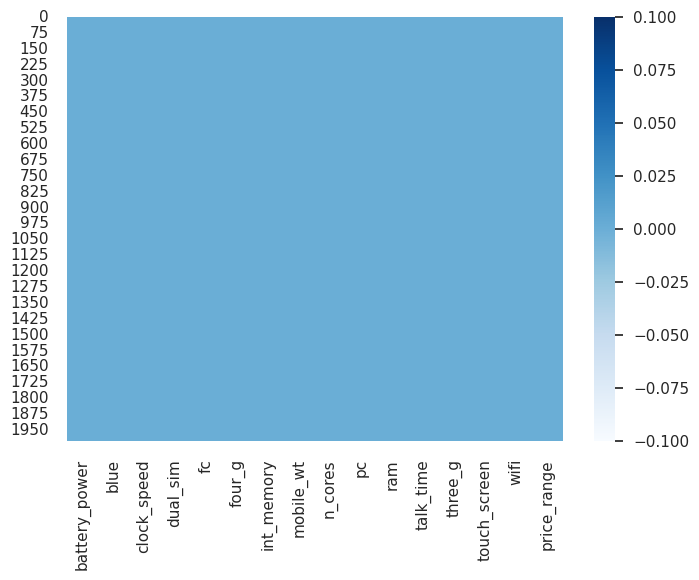

In [91]:
# heatmap of missing values
sns.heatmap(data_train.isnull(), cmap = 'Blues')

<Axes: >

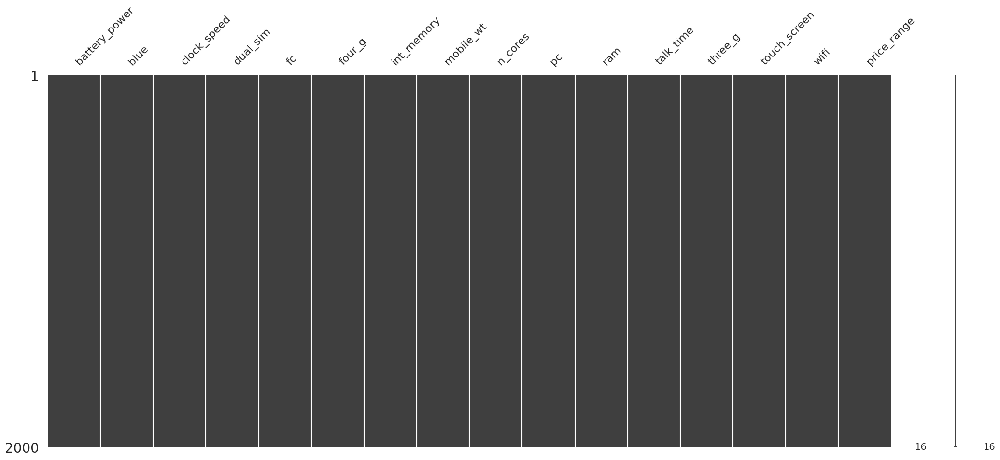

In [92]:
# Visualize missingg values as a matrix
msno.matrix(data_train)

Tidak ditemukan missing value pada dataset yang digunakan.

In [93]:
duplicated = data_train[data_train.duplicated()]
duplicated

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,mobile_wt,n_cores,pc,ram,talk_time,three_g,touch_screen,wifi,price_range


In [94]:
print("Jumlah nilai duplikat:", duplicated.shape[0])

Jumlah nilai duplikat: 0


Tidak ditemukan nilai yang duplikat pada data training.

In [95]:
df_PriceR = data_train['price_range'].value_counts().to_frame().sort_values(by = 'price_range').reset_index()
df_PriceR

,price_range,count
0,0,500
1,1,500
2,2,500
3,3,500


"price_range" adalah variabel target dengan nilai 0 (biaya rendah), 1 (biaya sedang), 2 (biaya tinggi) dan 3 (biaya sangat tinggi).

# **VISUALIZATION**

In [96]:
# menghitung korelasi antar fitur (kolom)
data_corr = data_train.corr()

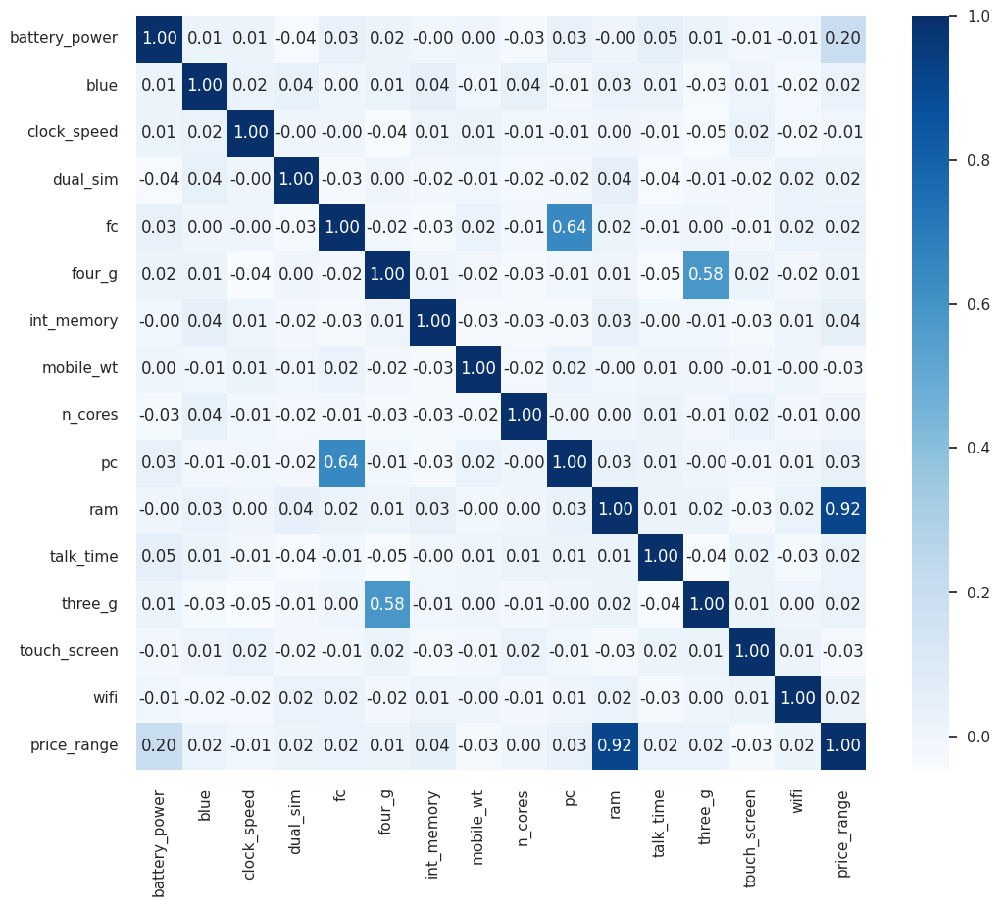

In [97]:
# visualisasi korelasi
plt.figure(figsize = (12, 10))
sns.set(font_scale=1)
sns.heatmap(data_corr, annot=True, fmt='.2f', cmap='Blues')
sns.set(font_scale = 2, style = 'white')


Dari gambar di atas dapat disimpulkan :
*   RAM memiliki hubungan yang sangat kuat dengan harga. Semakin besar kapasitas RAM, semakin tinggi harga ponsel.
*   Kamera depan dan kamera utama memiliki hubungan positif yang cukup kuat. Artinya, jika spesifikasi kamera depan tinggi, kamera utama cenderung juga memiliki spesifikasi tinggi.


*   Ada hubungan yang cukup signifikan antara ponsel dengan teknologi 4G dan 3G. Ini menunjukkan bahwa ponsel dengan dukungan 4G sering kali juga mendukung 3G.





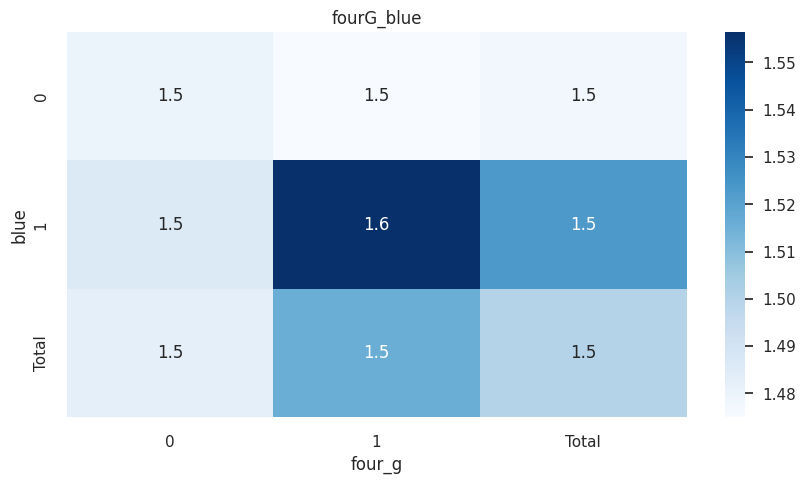

In [98]:
plt.figure(figsize = (10,5))
sns.set(font_scale = 1)

pivot_table = pd.pivot_table(data = data_train, index = 'blue', columns = 'four_g', values = 'price_range', margins = True, margins_name = 'Total')
sns.heatmap(pivot_table, cmap = 'Blues', annot = True).set(title = 'fourG_blue')
plt.show()

Ponsel dengan Bluetooth dan dukungan 4G (blue=1, four_g=1) adalah kombinasi fitur yang paling menonjol, dengan nilai rata-rata tertinggi (1.6). Hal ini berarti konsumen cenderung lebih menyukai ponsel yang memiliki bluetooth dan dukungan 4G.

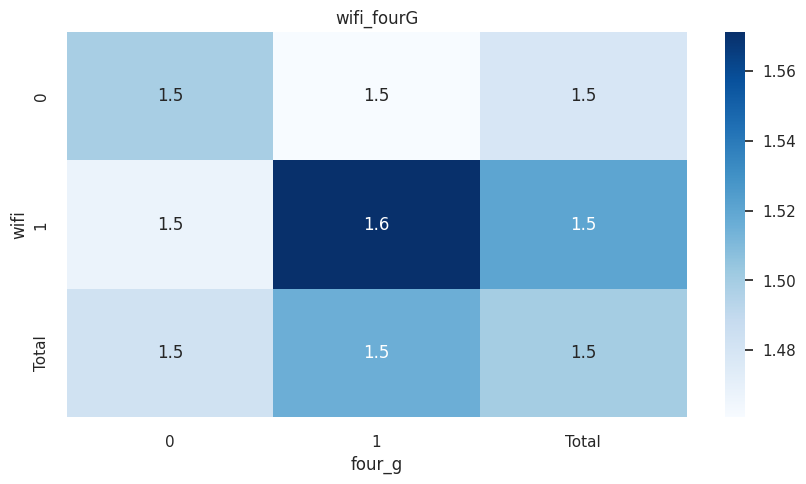

In [99]:
plt.figure(figsize = (10,5))
sns.set(font_scale = 1)

pivot_table = pd.pivot_table(data = data_train, index = 'wifi', columns = 'four_g', values = 'price_range', margins = True, margins_name = 'Total')
sns.heatmap(pivot_table, cmap = 'Blues', annot = True).set(title = 'wifi_fourG')
plt.show()

Ponsel dengan wifi dan dukungan 4G adalah kombinasi fitur yang paling menonjol, dengan nilai rata-rata tertinggi (1.6). Hal ini berarti konsumen cenderung lebih menyukai ponsel yang memiliki wifi dan dukungan 4G.

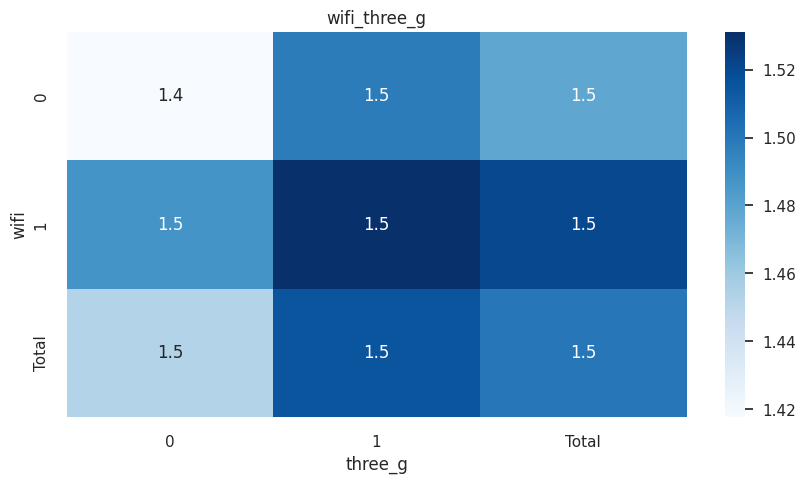

In [100]:
plt.figure(figsize = (10,5))
sns.set(font_scale = 1)

pivot_table = pd.pivot_table(data = data_train, index = 'wifi', columns = 'three_g', values = 'price_range', margins = True, margins_name = 'Total')
sns.heatmap(pivot_table, cmap = 'Blues', annot = True).set(title = 'wifi_three_g')
plt.show()

Ponsel dengan WiFi dan dukungan 3G adalah standar minimum yang penting. Produk tanpa fitur ini mungkin kurang menarik di pasar, sehingga sebaiknya diprioritaskan untuk menawarkan kedua fitur tersebut secara bersamaan.

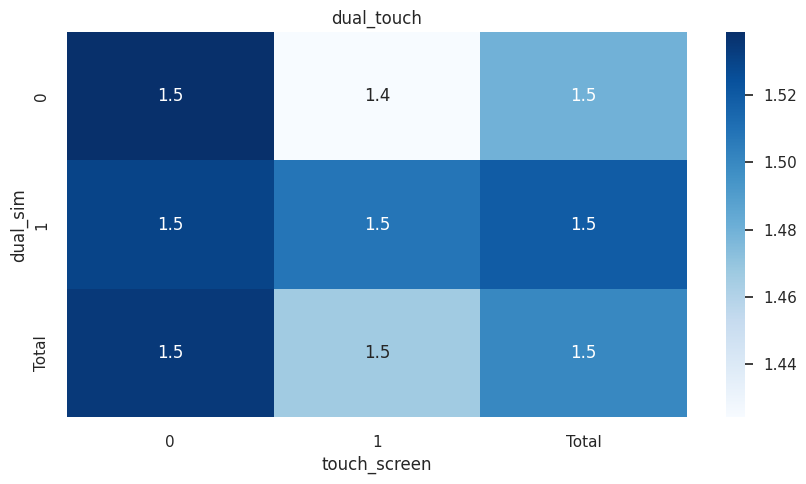

In [101]:
plt.figure(figsize = (10,5))
sns.set(font_scale = 1)

pivot_table = pd.pivot_table(data = data_train, index = 'dual_sim', columns = 'touch_screen', values = 'price_range', margins = True, margins_name = 'Total')
sns.heatmap(pivot_table, cmap = 'Blues', annot = True).set(title = 'dual_touch')
plt.show()

Ponsel dengan dual SIM dan layar sentuh lebih relevan untuk pasar.

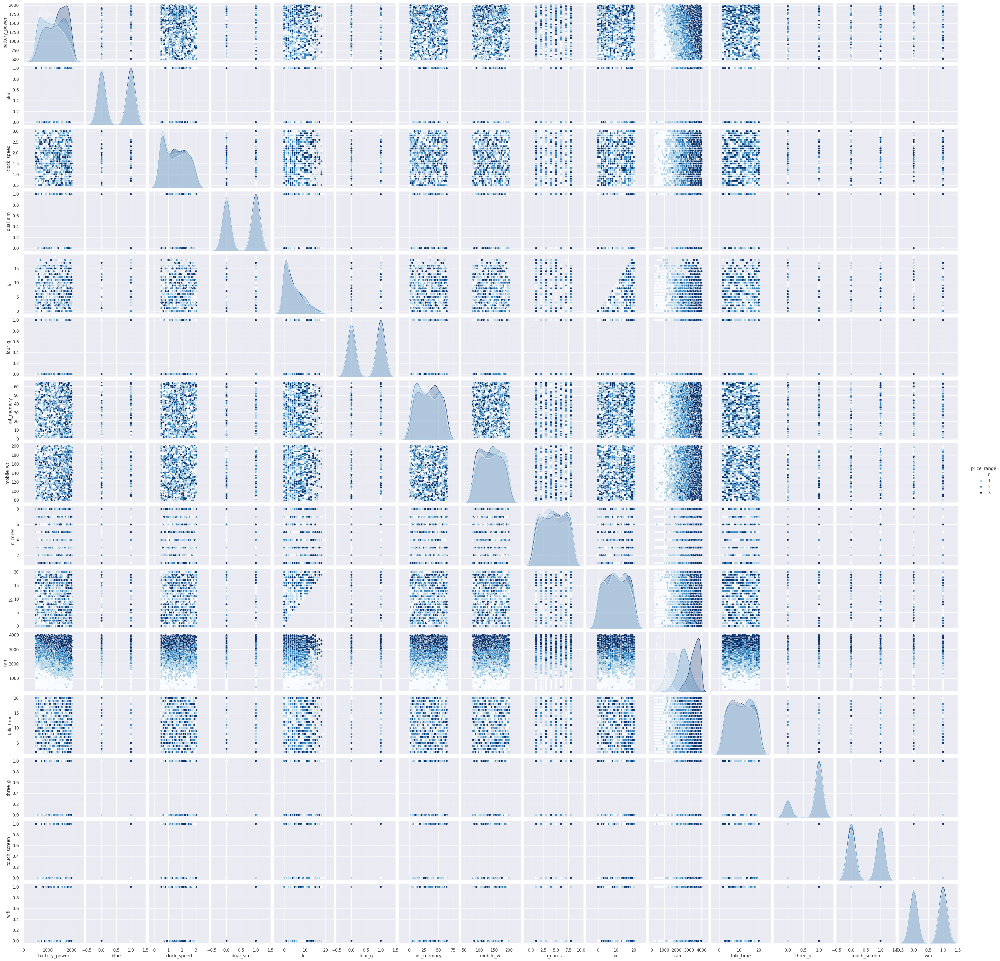

In [102]:
sns.pairplot(data = data_train, hue = 'price_range', palette = 'Blues')
plt.show()

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




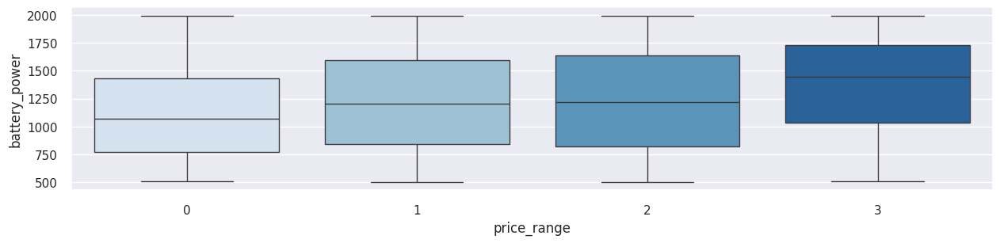

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




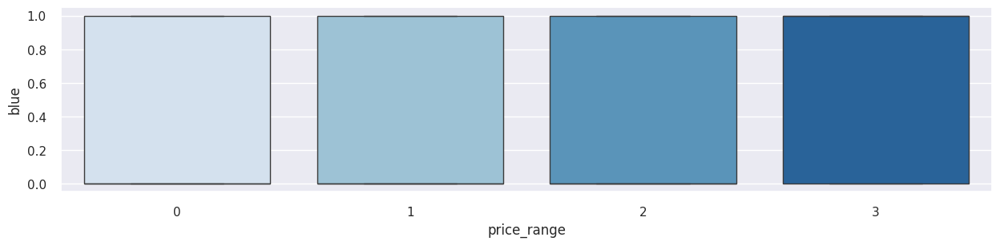

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




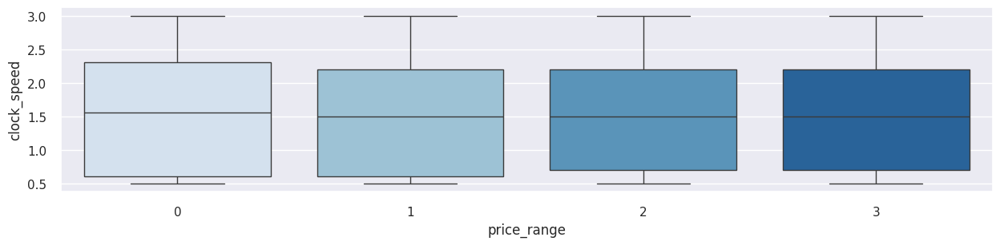

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




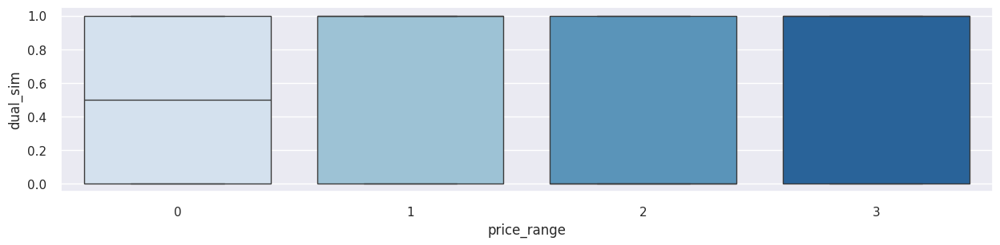

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




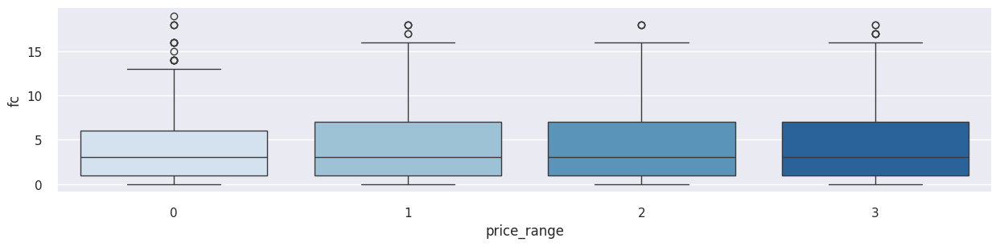

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




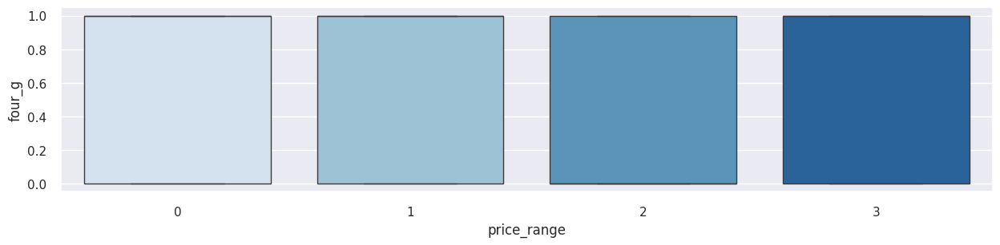

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




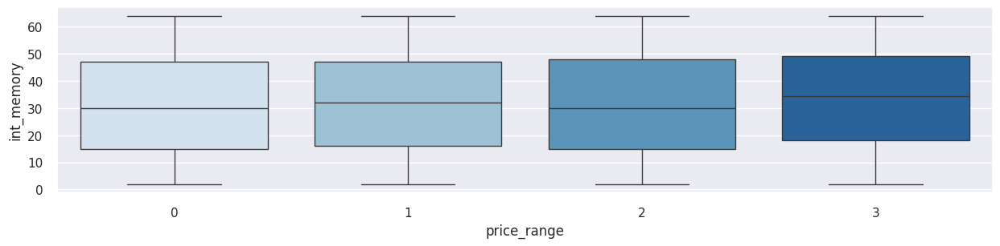

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




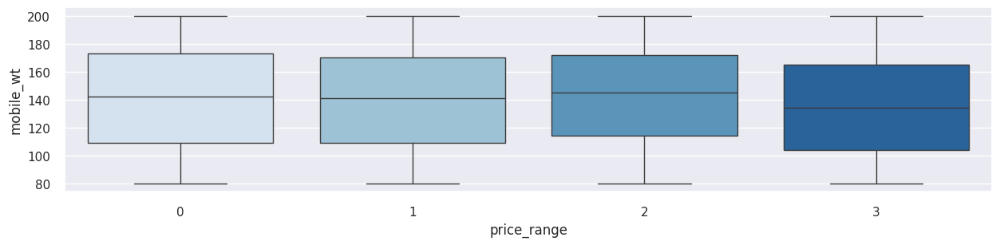

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




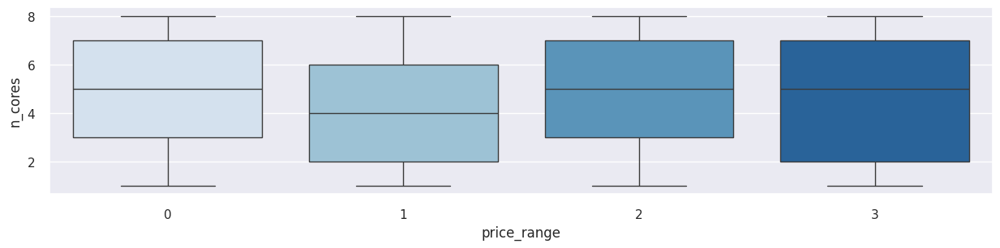

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




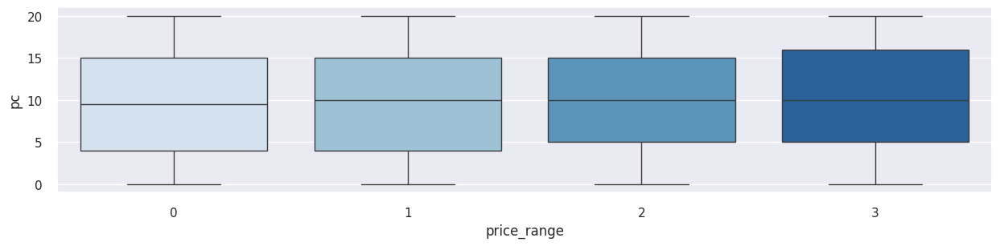

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




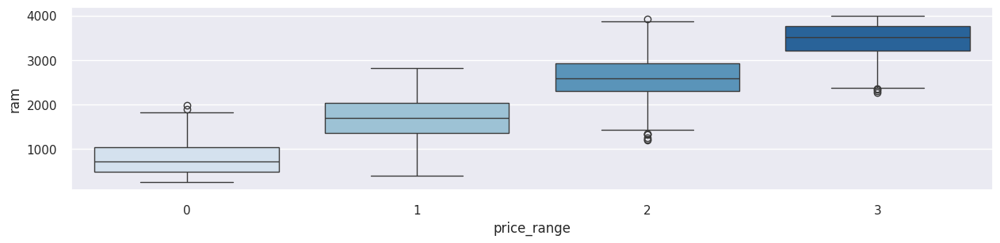

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




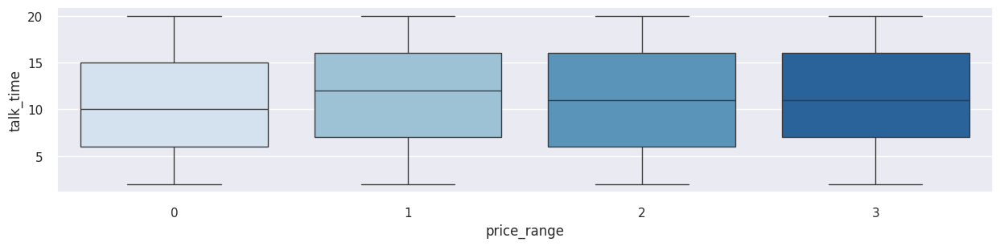

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




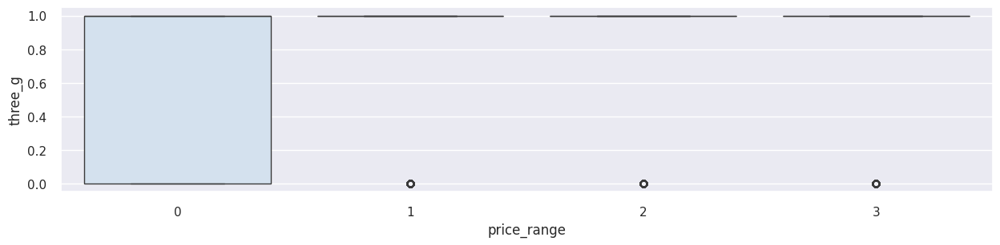

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




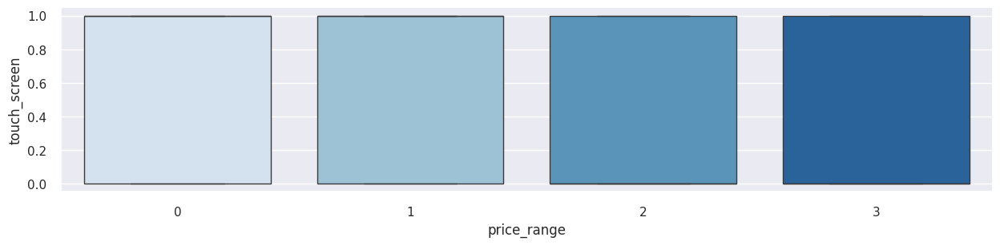

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




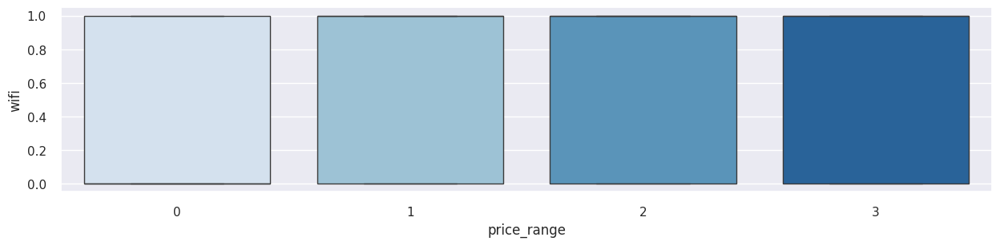

<ipython-input-103-8855799dbd8f>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




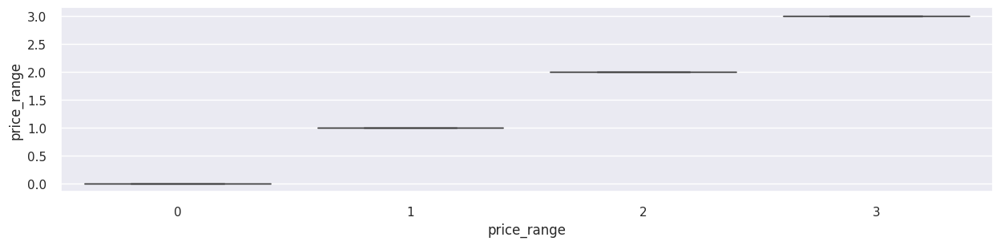

In [103]:
columns = data_train.columns.values
sns.set(font_scale = 1)

for col in columns:
    plt.figure(figsize = (15, 3))
    sns.boxplot(x = 'price_range', y = data_train[col], data = data_train, palette = 'Blues')
    plt.show()

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




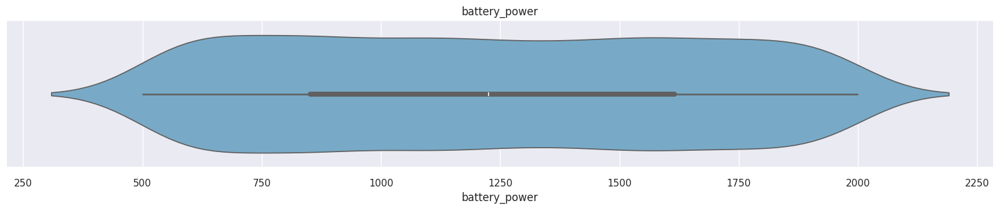

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




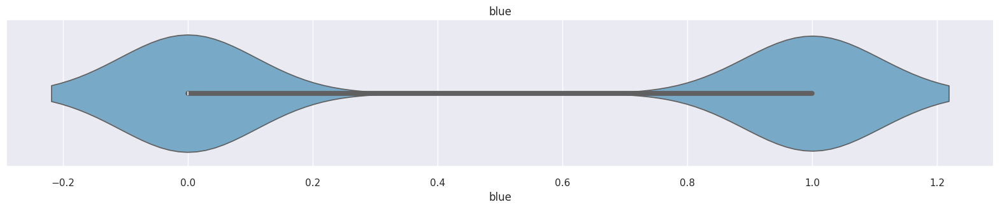

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




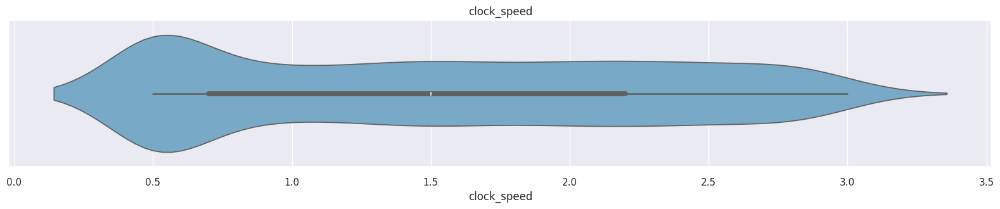

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




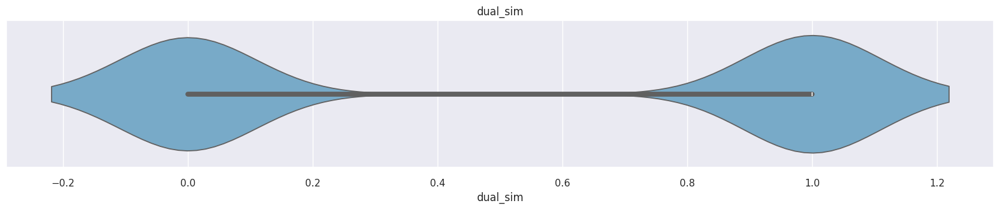

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




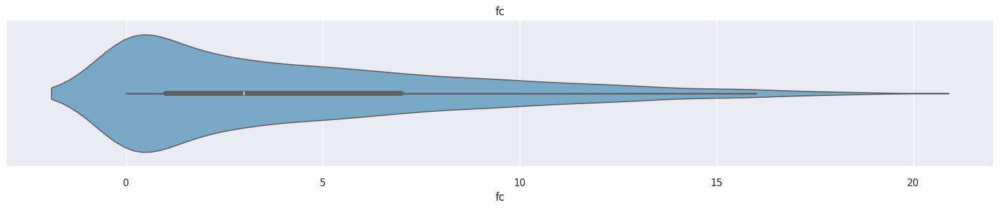

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




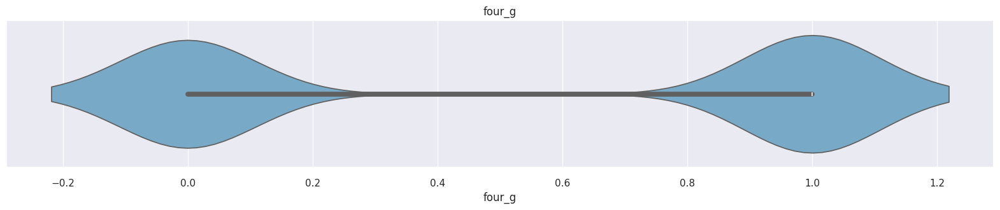

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




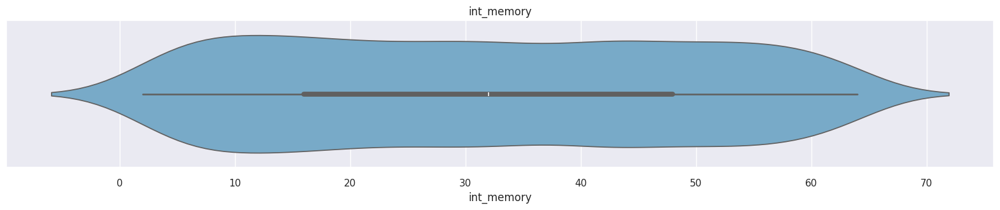

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




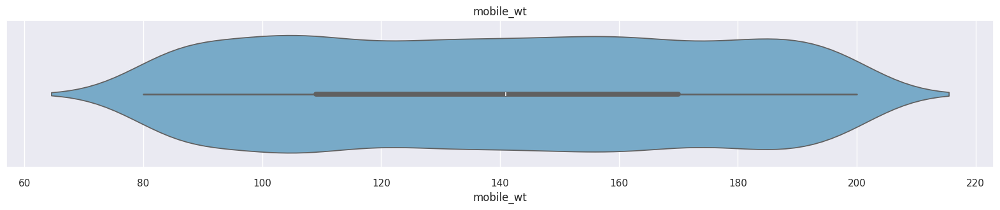

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




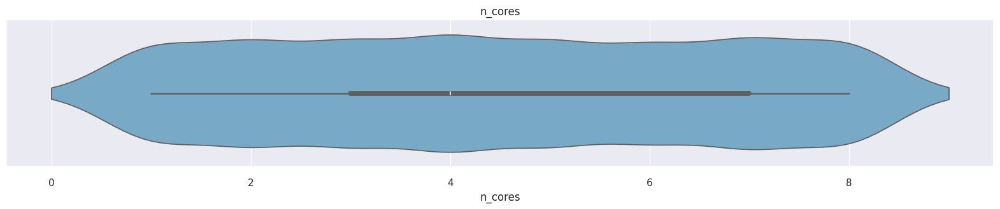

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




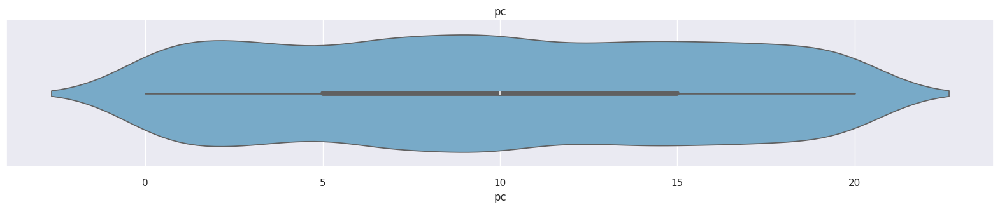

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




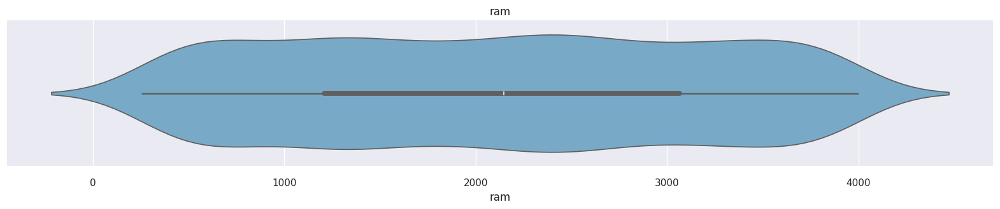

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




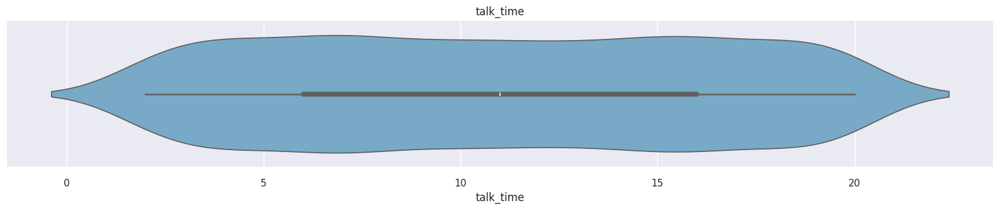

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




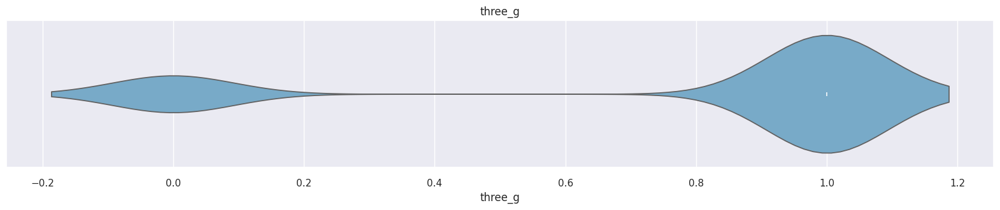

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




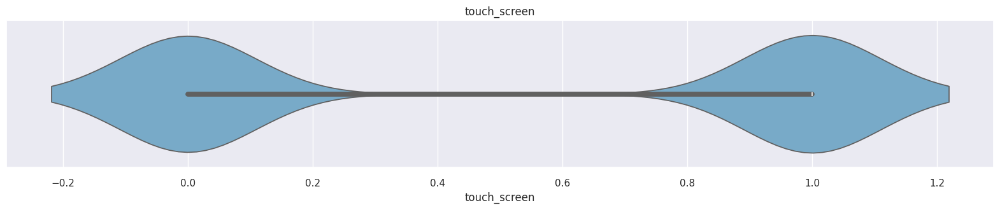

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




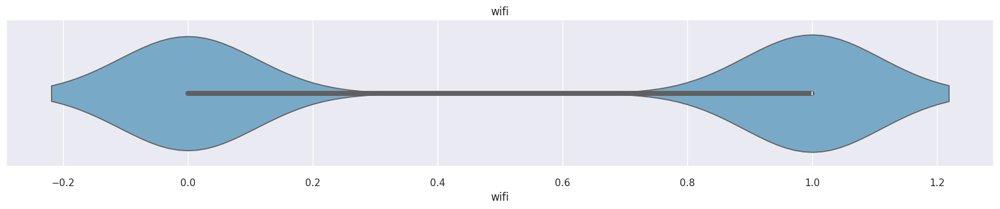

<ipython-input-104-874238b24b2e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




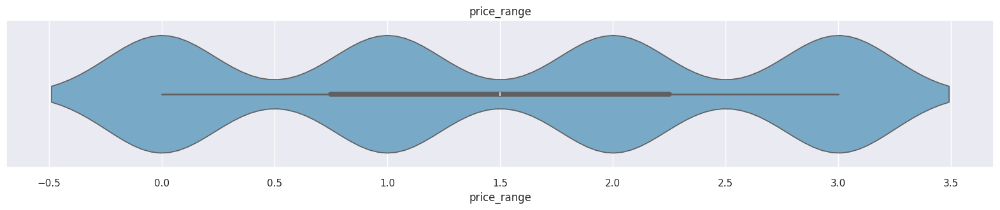

In [104]:
columns = data_train.columns.values
sns.set(font_scale = 1)

for col in columns:
    plt.figure(figsize = (20, 3))
    sns.violinplot(x = data_train[col], palette = 'Blues')
    plt.title(col)
    plt.show()

<ipython-input-105-235d279c3f39>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-105-235d279c3f39>:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-105-235d279c3f39>:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-105-235d279c3f39>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-105-235d279c3f39>:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and

<Axes: xlabel='wifi', ylabel='count'>

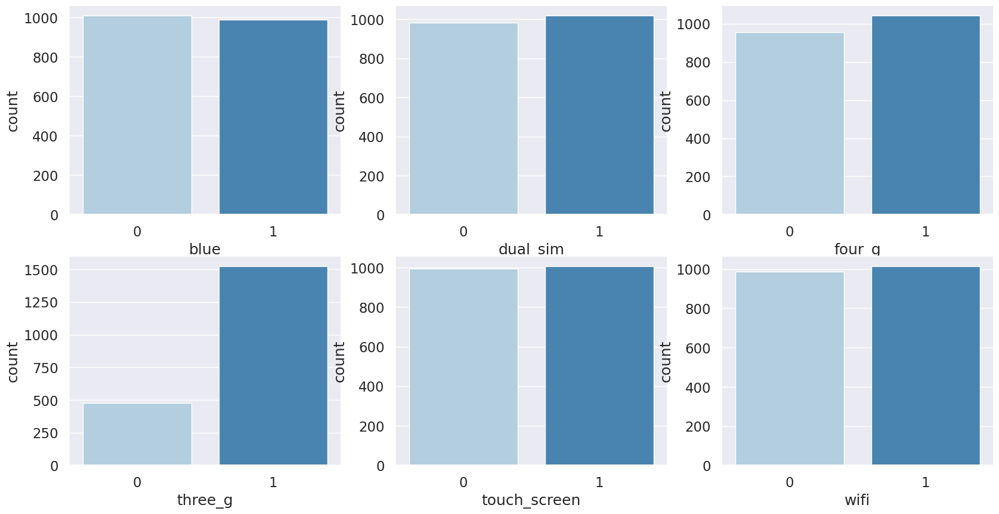

In [105]:
plt.figure(figsize = (20, 10))
sns.set(font_scale=1.5)

plt.subplot(2, 3, 1)
sns.countplot(x = "blue", data = data_train, palette = 'Blues')

plt.subplot(2, 3, 2)
sns.countplot(x = "dual_sim", data = data_train, palette = 'Blues')

plt.subplot(2, 3, 3)
sns.countplot(x = "four_g", data = data_train, palette = 'Blues')

plt.subplot(2, 3, 4)
sns.countplot(x = "three_g", data = data_train, palette = 'Blues')

plt.subplot(2, 3, 5)
sns.countplot(x = "touch_screen", data = data_train, palette = 'Blues')

plt.subplot(2, 3, 6)
sns.countplot(x = "wifi", data = data_train, palette = 'Blues')

Didapatkan bahwa ponsel dengan tidak memiliki bluetooth, memiliki dual SIM, didukung 4G dan 3G, dapat touchscreen, dan memiliki fitur wifi lebih banyak terjual di pasaran.

<ipython-input-106-b68ba117aa36>:3: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

<ipython-input-106-b68ba117aa36>:4: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

<ipython-input-106-b68ba117aa36>:5: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

<ipython-input-106-b68ba117aa36>:6: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

<ipython-input-106-b68ba117aa36>:7: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

<ipython-input-106-b68ba117aa36>:8: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



<Axes: xlabel='talk_time', ylabel='Count'>

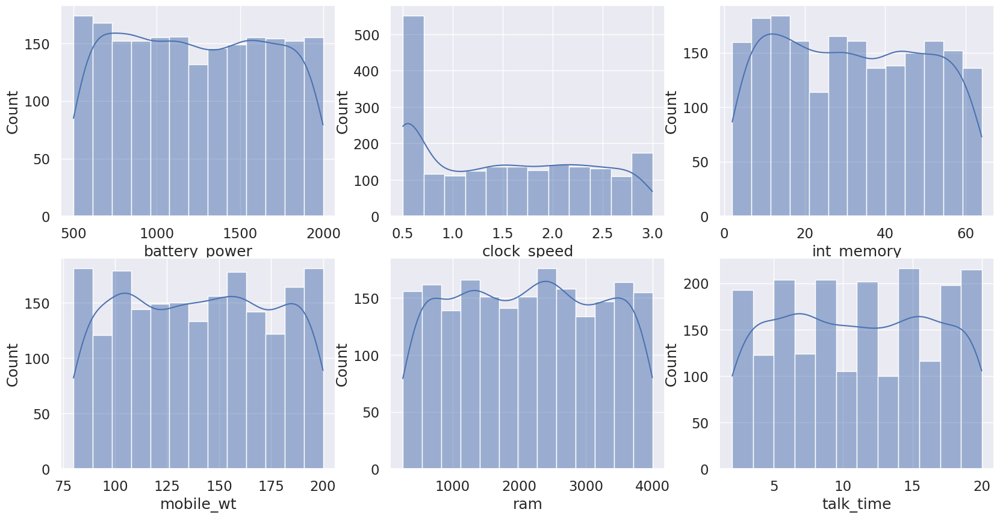

In [106]:
fig, ax = plt.subplots(2, 3, figsize = (20, 10))

sns.histplot(data_train['battery_power'], kde = True, palette = 'PuBu', ax = ax[0, 0])
sns.histplot(data_train['clock_speed'], kde = True, palette = 'PuBu', ax = ax[0, 1])
sns.histplot(data_train['int_memory'], kde = True, palette = 'PuBu', ax = ax[0, 2])
sns.histplot(data_train['mobile_wt'], kde = True, palette = 'PuBu', ax = ax[1, 0])
sns.histplot(data_train['ram'], kde = True, palette = 'PuBu', ax = ax[1, 1])
sns.histplot(data_train['talk_time'], kde = True, palette = 'PuBu', ax = ax[1, 2])

Gambar di atas menunjukkan spesifikasi ponsel seperti daya baterai, kecepatan prosesor, memori internal, berat, RAM, dan waktu bicara. Mayoritas ponsel punya baterai 1000-1500 mAh, RAM 1-4 GB, dan memori internal merata hingga 64 GB. Berat ponsel sekitar 75-200 gram, sedangkan kecepatan prosesor banyak di kisaran rendah (0.5 GHz) tapi ada juga yang tinggi (hingga 3 GHz).

<ipython-input-107-ab6e6f83f68a>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-107-ab6e6f83f68a>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-107-ab6e6f83f68a>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-107-ab6e6f83f68a>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-107-ab6e6f83f68a>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and wi

<Axes: xlabel='price_range', ylabel='ram'>

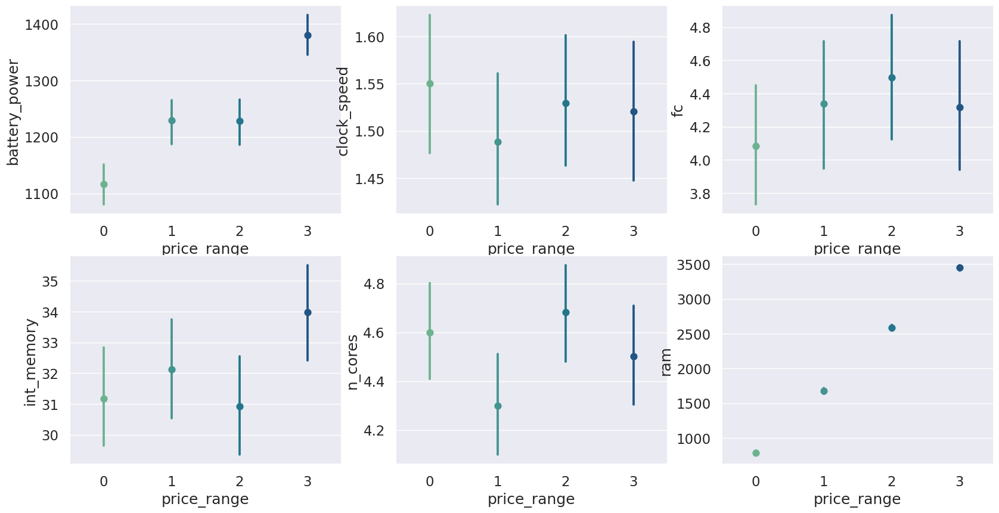

In [107]:
fig, ax = plt.subplots(2, 3, figsize = (20, 10))

sns.pointplot(y = 'battery_power', x = 'price_range', data = data_train, palette = 'crest', ax = ax[0, 0])
sns.pointplot(y = 'clock_speed', x = 'price_range', data = data_train, palette = 'crest', ax = ax[0, 1])
sns.pointplot(y = 'fc', x = 'price_range', data = data_train, palette = 'crest', ax = ax[0, 2])
sns.pointplot(y = 'int_memory', x = 'price_range', data = data_train, palette = 'crest', ax = ax[1, 0])
sns.pointplot(y = 'n_cores', x = 'price_range', data = data_train, palette = 'crest', ax = ax[1, 1])
sns.pointplot(y = 'ram', x = 'price_range', data = data_train, palette = 'crest', ax = ax[1, 2])

Error bar (Garis Vertikal):
Garis pendek = Spesifikasi mirip-mirip.
Garis panjang = Spesifikasi beragam, ada yang lebih rendah atau lebih tinggi di kategori itu.

Semakin mahal ponsel, baterai cenderung lebih besar.
clock_speed: Tidak terlalu banyak perubahan di semua rentang harga, rata-rata hampir sama.
Kamera depan sedikit meningkat di kategori harga lebih tinggi.
Ponsel mahal memiliki memori internal lebih besar.
Prosesor dengan lebih banyak inti biasanya ditemukan di ponsel kategori premium.
RAM meningkat secara signifikan dari ponsel murah hingga premium.


# **CLASSIFICATION MODELS**

**Decision Tree**

In [108]:
df = data_train
X = df.drop('price_range', axis = 1)
y = df['price_range'].values.reshape(-1, 1)

In [109]:
print ('X:', X.shape,'\ny:', y.shape)

X: (2000, 15) 
y: (2000, 1)


In [110]:
test_size = np.arange(start = 0.2, stop = 0.35, step = 0.05)

score_TS = []
for test in test_size:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test, random_state = 0)
    DT_model = DecisionTreeClassifier(max_depth = 3)
    DT_model.fit(X_train, y_train)
    score_TS.append (DT_model.score (X_test, y_test))

best_TS = pd.DataFrame({'test_size': test_size, 'Score': score_TS})
best_TS.sort_values(by = ['Score'], ascending = False, inplace = True)
best_TS.style.highlight_max(color = '#CAF0F8')

,test_size,Score
1,0.250000,0.762000
0,0.200000,0.747500
2,0.300000,0.735000


In [111]:
scaler = MinMaxScaler(feature_range = (0, 1))
norm_x = scaler.fit_transform(X)
X_norm = pd.DataFrame(norm_x, columns = list(X.columns))

X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size = 0.25, random_state = 0)

print('X_train shape: {} \ny_train shape: {}'.format(X_train.shape, y_train.shape))
print('X_test shape: {} \ny_test shape: {}'.format(X_test.shape, y_test.shape))

X_train shape: (1500, 15) 
y_train shape: (1500, 1)
X_test shape: (500, 15) 
y_test shape: (500, 1)


In [112]:
# hyperpameter tunning
# untuk mencari parameter yang bisa menghasilkan akurasi tinggi, dan didapatkan criterion = entropy, splitter = best, max_depth = 6
outcome = []

for criterion in ['gini', 'entropy']:
    for splitter in ['best', 'random']:
        for max_depth in range(3, 15):
            for max_features in ['sqrt', 'log2', None]:
                DT_clf = DecisionTreeClassifier(criterion = criterion, splitter = splitter, max_depth = max_depth, max_features=max_features, random_state=0)
                DT_clf.fit(X_train, y_train)
                y_pred = DT_clf.predict(X_test)

                accuracy = metrics.accuracy_score(y_test, y_pred)
                precision = metrics.precision_score(y_test, y_pred, average = 'micro')
                recall = metrics.recall_score(y_test, y_pred, average = 'micro')
                f1_score = metrics.f1_score(y_test, y_pred, average = 'micro')
                conf_mat = metrics.confusion_matrix(y_test, y_pred)

                outcome.append((criterion, splitter, max_depth, accuracy, precision, recall,
                               f1_score))


DT_outcome = pd.DataFrame(outcome, columns = ['criterion', 'splitter', 'max_depth','accuracy', 'precision', 'recall', 'f1_score'])
DT_outcome.sort_values(by='accuracy', ascending=False, inplace=True)
DT_outcome.style.highlight_max(color = '#CAF0F8')

,criterion,splitter,max_depth,accuracy,precision,recall,f1_score
83,entropy,best,6,0.812000,0.812000,0.812000,0.812000
80,entropy,best,5,0.806000,0.806000,0.806000,0.806000
128,entropy,random,9,0.804000,0.804000,0.804000,0.804000
116,entropy,random,5,0.796000,0.796000,0.796000,0.796000
44,gini,random,5,0.796000,0.796000,0.796000,0.796000
11,gini,best,6,0.794000,0.794000,0.794000,0.794000
86,entropy,best,7,0.792000,0.792000,0.792000,0.792000
8,gini,best,5,0.790000,0.790000,0.790000,0.790000
5,gini,best,4,0.788000,0.788000,0.788000,0.788000
53,gini,random,8,0.788000,0.788000,0.788000,0.788000


In [113]:
DT_best = DecisionTreeClassifier(criterion = 'entropy', splitter = 'best', max_depth = 6, max_features = None, random_state=0) # membuat model decision tree
DT_best.fit(X_train, y_train) # melatih model
y_pred = DT_best.predict(X_test) # memprediksi dengan model

In [114]:
y_pred

array([3, 0, 2, 2, 2, 0, 0, 3, 3, 1, 0, 3, 0, 2, 3, 0, 3, 2, 2, 1, 0, 0,
       3, 1, 2, 2, 3, 1, 3, 2, 2, 0, 2, 0, 2, 3, 0, 0, 3, 3, 2, 1, 2, 3,
       1, 3, 0, 1, 2, 2, 1, 3, 0, 3, 0, 2, 2, 1, 0, 3, 3, 1, 3, 2, 2, 2,
       3, 3, 1, 2, 3, 2, 1, 0, 1, 3, 2, 2, 2, 2, 3, 2, 3, 0, 0, 0, 1, 0,
       2, 3, 1, 3, 2, 1, 0, 3, 2, 3, 0, 3, 2, 2, 3, 1, 3, 2, 3, 2, 2, 3,
       3, 0, 0, 1, 3, 3, 0, 1, 0, 0, 1, 3, 1, 2, 2, 2, 1, 1, 0, 2, 1, 3,
       2, 3, 3, 3, 3, 2, 0, 1, 1, 2, 1, 3, 0, 3, 0, 0, 2, 0, 0, 2, 1, 1,
       3, 1, 0, 3, 1, 3, 2, 1, 3, 1, 3, 3, 3, 3, 1, 0, 3, 2, 2, 3, 3, 0,
       2, 2, 3, 0, 3, 1, 0, 1, 2, 1, 2, 0, 3, 3, 1, 1, 0, 3, 2, 0, 1, 2,
       1, 0, 3, 3, 3, 1, 1, 3, 3, 3, 0, 0, 0, 2, 3, 3, 0, 0, 1, 3, 2, 3,
       3, 3, 0, 0, 3, 2, 3, 1, 0, 2, 0, 0, 0, 3, 3, 0, 2, 3, 0, 0, 0, 3,
       3, 3, 0, 0, 1, 3, 3, 1, 3, 0, 3, 1, 1, 0, 1, 3, 2, 2, 0, 0, 1, 2,
       3, 2, 1, 3, 1, 2, 1, 3, 2, 2, 2, 3, 2, 2, 2, 1, 0, 2, 2, 1, 0, 0,
       2, 2, 2, 2, 0, 2, 2, 0, 1, 3, 3, 0, 2, 0, 0,

In [115]:
conf_mat = confusion_matrix(y_test, y_pred)
conf_mat

array([[117,   7,   0,   0],
       [ 15,  73,  22,   0],
       [  0,  16,  92,  17],
       [  0,   0,  17, 124]])

In [116]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.94      0.91       124
           1       0.76      0.66      0.71       110
           2       0.70      0.74      0.72       125
           3       0.88      0.88      0.88       141

    accuracy                           0.81       500
   macro avg       0.81      0.81      0.81       500
weighted avg       0.81      0.81      0.81       500



model memiliki akurasi 81%, yang berarti 81% dari semua prediksi model adalah benar (untuk semua kelas). Kelas 0 dan 3 memiliki performa yang baik dengan precision dan recall tinggi (di atas 80%).
Kelas 1 memiliki precision lebih rendah (76%) dan recall yang lebih rendah (66%), menunjukkan model kesulitan untuk memprediksi kelas ini dengan benar.

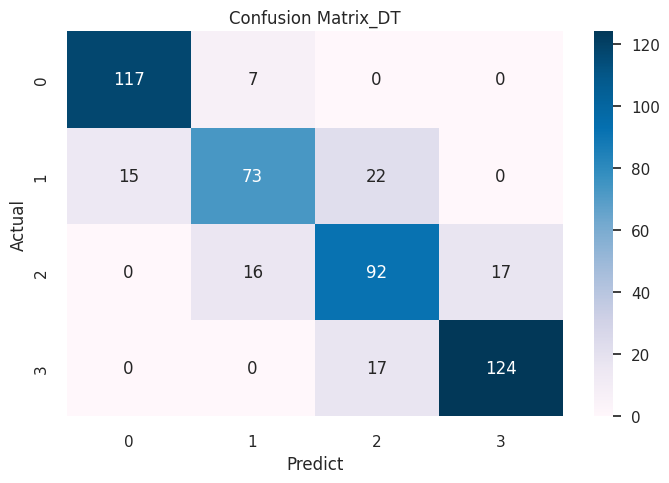

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



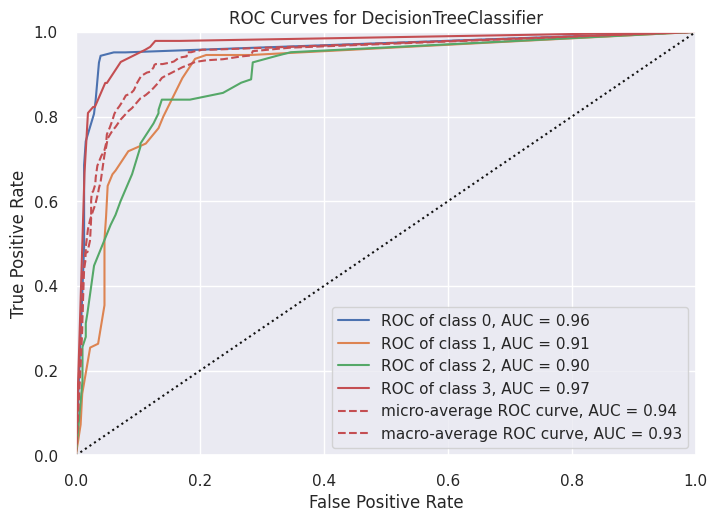

<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [117]:
# Confusion Matrix
plt.figure(figsize = (8, 5))
sns.set(font_scale = 1)
sns.heatmap(conf_mat, annot = True, fmt = 'd', cmap = 'PuBu', cbar = True)
plt.title('Confusion Matrix_DT')
plt.xlabel('Predict')
plt.ylabel('Actual')
plt.show()

# ROC Curve
plot = ROCAUC(DT_best)

plot.fit(X_train, y_train)        # Fit the training data to the visualizer
plot.score(X_test, y_test)        # Evaluate the model on the test data
plot.show()

In [118]:
text_representation = tree.export_text(DT_best)
print(text_representation)

|--- feature_10 <= 0.53
|   |--- feature_10 <= 0.25
|   |   |--- feature_0 <= 0.50
|   |   |   |--- feature_10 <= 0.21
|   |   |   |   |--- class: 0
|   |   |   |--- feature_10 >  0.21
|   |   |   |   |--- feature_8 <= 0.50
|   |   |   |   |   |--- feature_10 <= 0.23
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_10 >  0.23
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_8 >  0.50
|   |   |   |   |   |--- class: 0
|   |   |--- feature_0 >  0.50
|   |   |   |--- feature_10 <= 0.15
|   |   |   |   |--- feature_10 <= 0.08
|   |   |   |   |   |--- feature_7 <= 0.99
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_7 >  0.99
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_10 >  0.08
|   |   |   |   |   |--- feature_0 <= 0.88
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_0 >  0.88
|   |   |   |   |   |   |--- class: 0
|   |   |   |--- feature_10 >  0.15
|   |   |   |   |--- feature_0 <

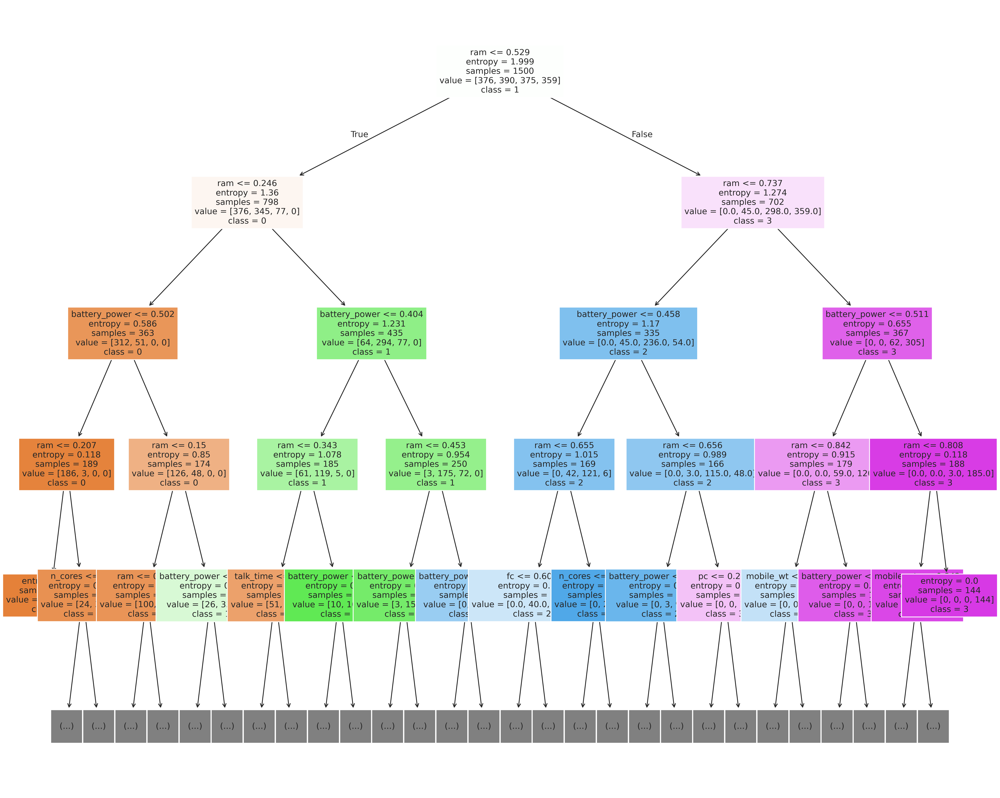

In [119]:
class_names = ['0','1', '2', '3']
fig = plt.figure(figsize=(20, 17), dpi = 400)
_ = tree.plot_tree(DT_best, feature_names = X.columns, filled=True, class_names = class_names, fontsize=10, max_depth = 4)

**Random Forest**

In [120]:
X = df.drop('price_range', axis = 1)
y = df['price_range'].values.reshape(-1, 1)

In [121]:
print('X: {}\ny:{}'.format(X.shape, y.shape))

X: (2000, 15)
y:(2000, 1)


In [122]:
test_size = np.arange(start = 0.2, stop = 0.35, step = 0.05)
score_RF = []

for test in test_size:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test, random_state = 0)
    RF_model = RandomForestClassifier()
    RF_model.fit(X_train, y_train)
    score_RF.append(RF_model.score(X_test, y_test))

RF_S = pd.DataFrame({'test_size': test_size, 'Score': score_RF})
RF_S.sort_values(by = ['Score'], ascending = False, inplace = True)
RF_S.style.highlight_max(color = "#CAF0F8")

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



,test_size,Score
1,0.250000,0.818000
2,0.300000,0.798333
0,0.200000,0.797500


In [123]:
scaler = MinMaxScaler(feature_range = (0, 1))
norm_x = scaler.fit_transform(X)
X_norm = pd.DataFrame(norm_x, columns = list(X.columns))

X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size = 0.25, random_state = 0)

print('X_train shape: {} \ny_train shape: {}'.format(X_train.shape, y_train.shape))
print('X_test shape: {} \ny_test shape: {}'.format(X_test.shape, y_test.shape))

X_train shape: (1500, 15) 
y_train shape: (1500, 1)
X_test shape: (500, 15) 
y_test shape: (500, 1)


In [124]:
# hyperpameter tunning
# untuk mencari parameter yang bisa menghasilkan akurasi tinggi, dan didapatkan criterion = gini, n_estimators = 100, max_depth = 5
outcome = []

for n_estimators in [100, 200, 500]:
    for criterion in ['gini', 'entropy']:
        for max_depth in range(3, 15):
            for max_features in ['sqrt', 'log2', None]:
                RF_clf = RandomForestClassifier(n_estimators = n_estimators, criterion = criterion, max_depth = max_depth, max_features = max_features, random_state = 0)
                RF_clf.fit(X_train, y_train)
                y_pred = RF_clf.predict(X_test)

                accuracy = metrics.accuracy_score(y_test, y_pred)
                precision = metrics.precision_score(y_test, y_pred, average = 'micro')
                recall = metrics.recall_score(y_test, y_pred, average = 'micro')
                f1_score = metrics.f1_score(y_test, y_pred, average = 'micro')

                outcome.append((n_estimators, criterion, max_depth, accuracy , precision, recall,
                               f1_score))


RF_outcome = pd.DataFrame(outcome, columns = ['n_estimators','criterion','max_depth','accuracy', 'precision', 'recall', 'f1_score'])
RF_outcome.sort_values(by='accuracy', ascending=False, inplace=True)
RF_outcome.style.highlight_max(color = '#CAF0F8')

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d

,n_estimators,criterion,max_depth,accuracy,precision,recall,f1_score
8,100,gini,5,0.836000,0.836000,0.836000,0.836000
59,100,entropy,10,0.834000,0.834000,0.834000,0.834000
152,500,gini,5,0.834000,0.834000,0.834000,0.834000
80,200,gini,5,0.832000,0.832000,0.832000,0.832000
155,500,gini,6,0.832000,0.832000,0.832000,0.832000
191,500,entropy,6,0.830000,0.830000,0.830000,0.830000
11,100,gini,6,0.830000,0.830000,0.830000,0.830000
83,200,gini,6,0.830000,0.830000,0.830000,0.830000
53,100,entropy,8,0.830000,0.830000,0.830000,0.830000
197,500,entropy,8,0.828000,0.828000,0.828000,0.828000


In [125]:
RF_best = RandomForestClassifier(n_estimators = 100, criterion = 'gini', max_depth = 5, max_features = None, random_state = 0)
RF_best.fit(X_train, y_train)
y_pred = RF_best.predict(X_test)

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [126]:
conf_matRF = confusion_matrix(y_test, y_pred)
conf_matRF

array([[115,   9,   0,   0],
       [ 13,  83,  14,   0],
       [  0,  20,  90,  15],
       [  0,   0,  11, 130]])

In [127]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.93      0.91       124
           1       0.74      0.75      0.75       110
           2       0.78      0.72      0.75       125
           3       0.90      0.92      0.91       141

    accuracy                           0.84       500
   macro avg       0.83      0.83      0.83       500
weighted avg       0.83      0.84      0.83       500



model memiliki akurasi 84%, yang berarti 84% dari semua prediksi model adalah benar (untuk semua kelas). Kelas 0 dan 3 memiliki performa yang baik dengan precision dan recall tinggi (di atas 80%). Kelas 1 memiliki precision lebih rendah (74%) dan recall yang lebih rendah (675), menunjukkan model kesulitan untuk memprediksi kelas ini dengan benar.

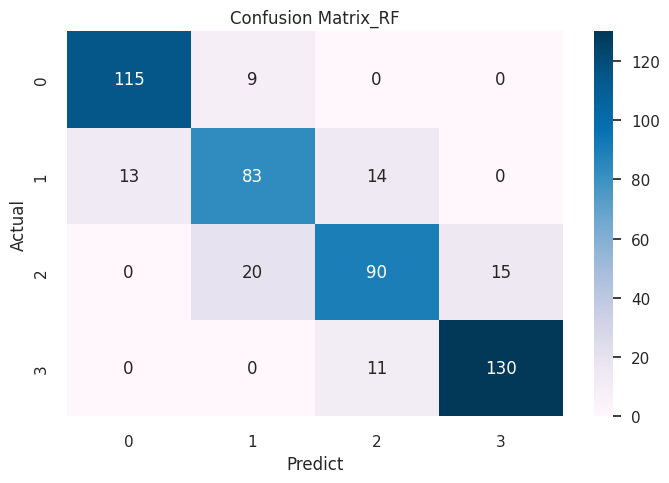

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



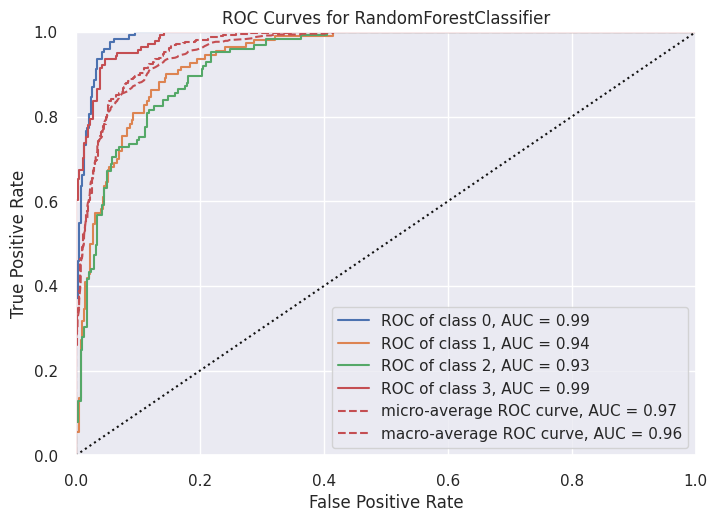

<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [128]:
# Confusion Matrix
plt.figure(figsize = (8, 5))
sns.set(font_scale = 1)
sns.heatmap(conf_matRF, annot = True, fmt = 'd', cmap = 'PuBu', cbar = True)
plt.title('Confusion Matrix_RF')
plt.xlabel('Predict')
plt.ylabel('Actual')
plt.show()

# ROC Curve
plot = ROCAUC(RF_best)

plot.fit(X_train, y_train)        # Fit the training data to the visualizer
plot.score(X_test, y_test)        # Evaluate the model on the test data
plot.show()

Dari kedua Classifications model yang digunakan (decision tree dan random forest) didapatkan bahwa akurasi dari random forest lebih tinggi daripada akurasi decision tree